In [5]:
import os
import cv2
import numpy as np
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
input_shape = (128, 128, 3)


In [3]:
def load_images(path):
    images = []
    for file in os.listdir(path):
        if file.endswith('.jpg'):
            image_path = os.path.join(path, file)
            image = cv2.imread(image_path)
            image = cv2.resize(image, input_shape[:2])
            image = image.astype('float32') / 255.
            images.append(image)
    return np.array(images)


In [6]:
train_images = load_images('/content/drive/MyDrive/test')
test_images = load_images('/content/drive/MyDrive/train')


In [7]:
input_img = Input(shape=input_shape)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

x = Conv2D(16, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')


In [8]:
import matplotlib.pyplot as plt

# Train the model for 50 epochs
autoencoder.fit(train_images, train_images,
                epochs=100,
                batch_size=128,
                shuffle=True,
                validation_data=(test_images, test_images))



Epoch 1/5
8/8 [==============================] - 21s 1s/step - loss: 0.6485 - val_loss: 0.6148
Epoch 2/5
8/8 [==============================] - 2s 276ms/step - loss: 0.5621 - val_loss: 0.4975
Epoch 3/5
8/8 [==============================] - 2s 271ms/step - loss: 0.4343 - val_loss: 0.3895
Epoch 4/5
8/8 [==============================] - 2s 271ms/step - loss: 0.3679 - val_loss: 0.3692
Epoch 5/5
8/8 [==============================] - 2s 282ms/step - loss: 0.3629 - val_loss: 0.3677


107/107 [==============================] - 2s 12ms/step


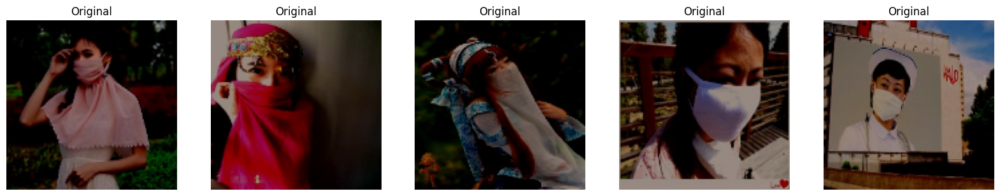

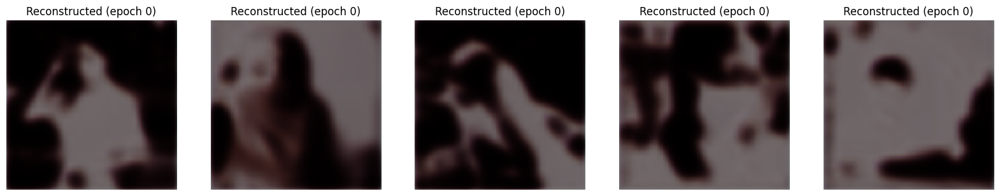

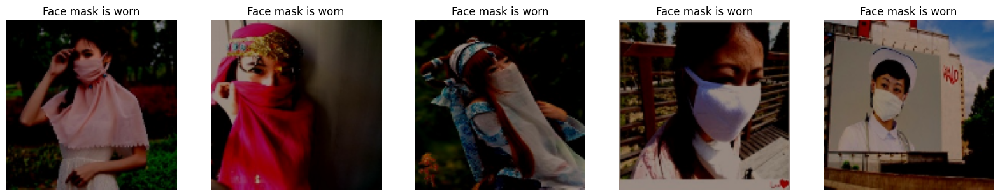

107/107 [==============================] - 1s 10ms/step


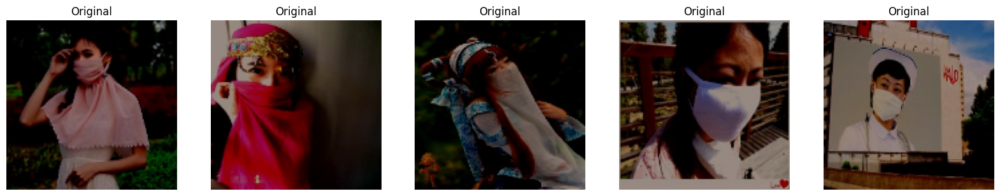

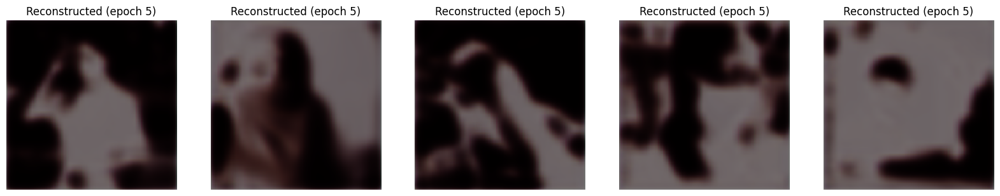

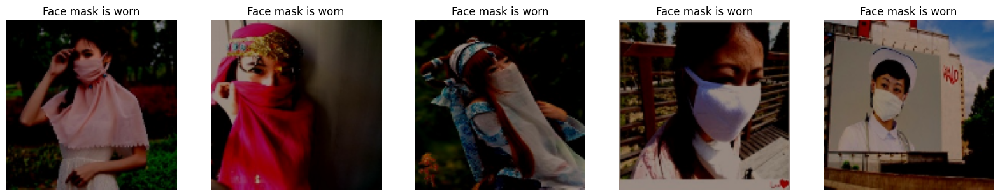

107/107 [==============================] - 1s 11ms/step


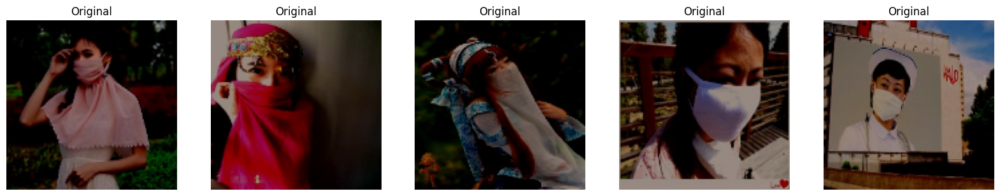

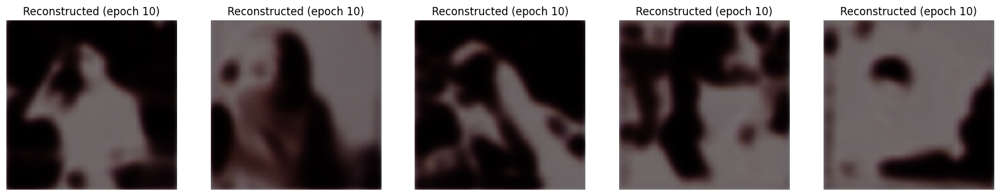

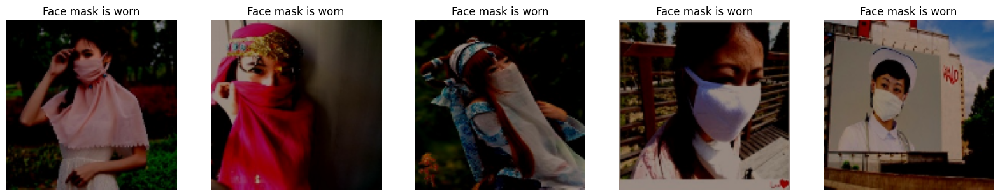

107/107 [==============================] - 1s 13ms/step


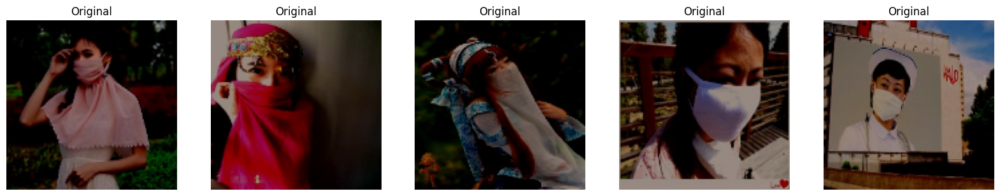

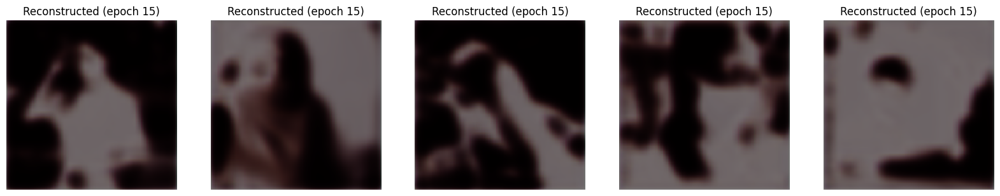

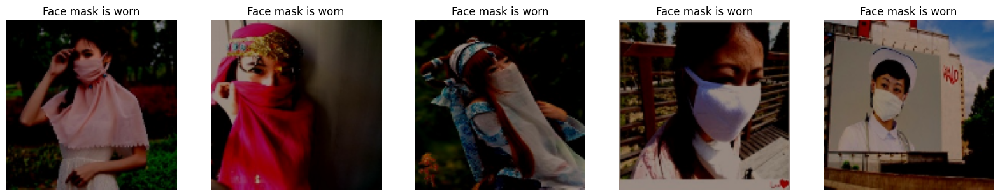

107/107 [==============================] - 1s 10ms/step


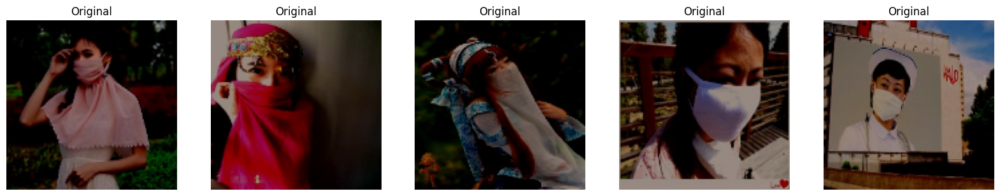

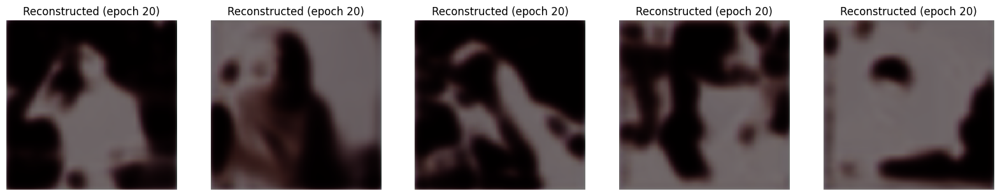

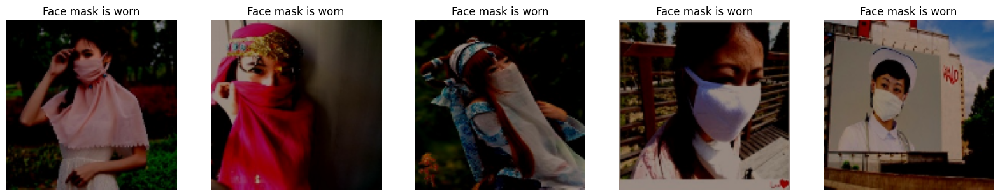

107/107 [==============================] - 1s 10ms/step


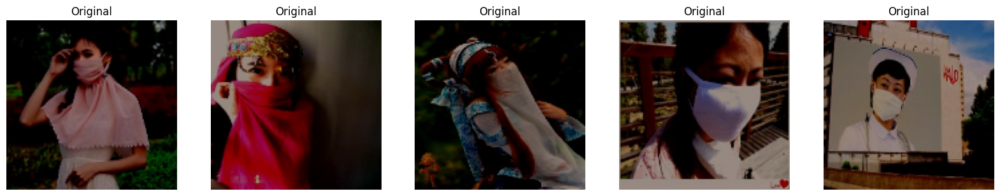

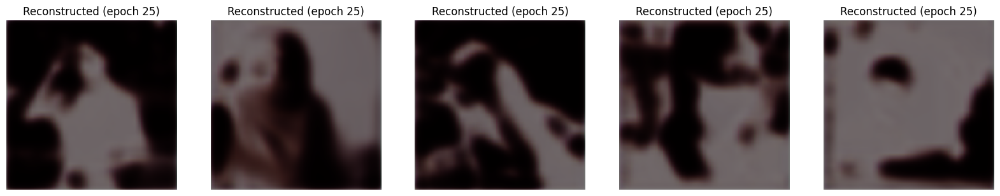

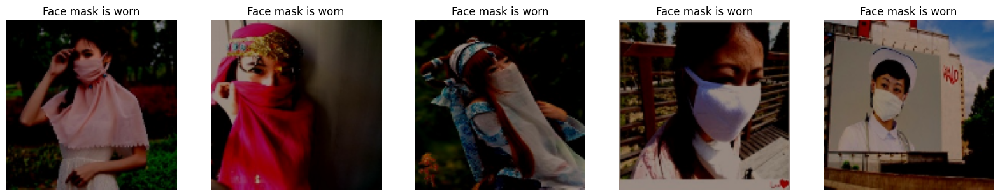

107/107 [==============================] - 1s 10ms/step


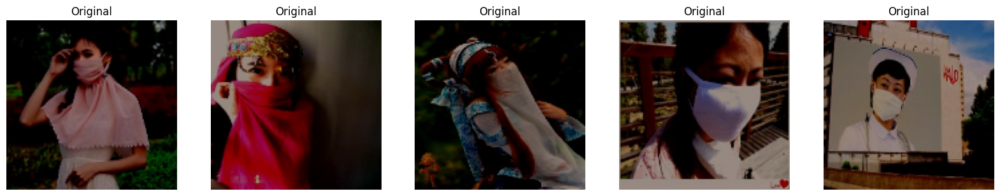

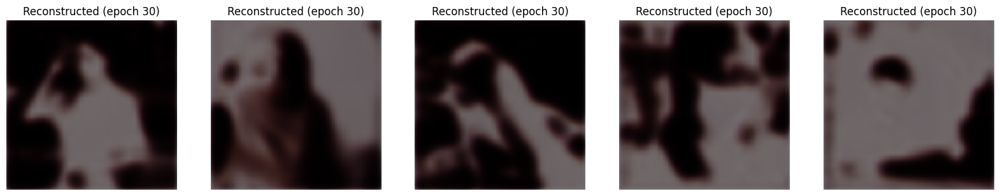

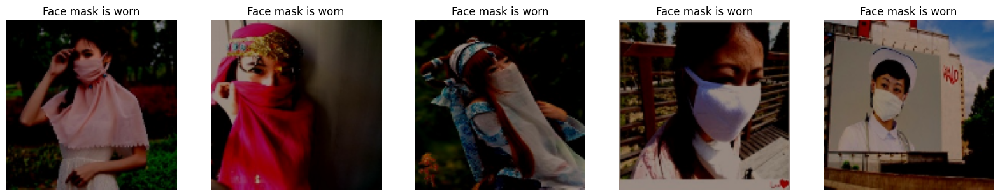

107/107 [==============================] - 1s 10ms/step


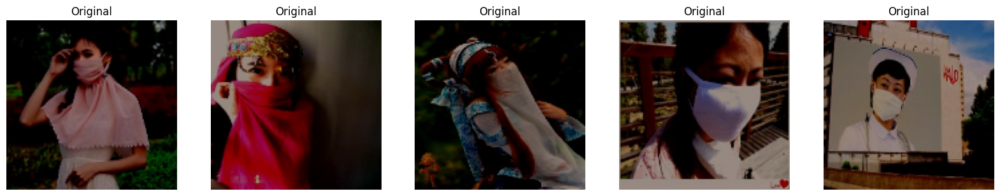

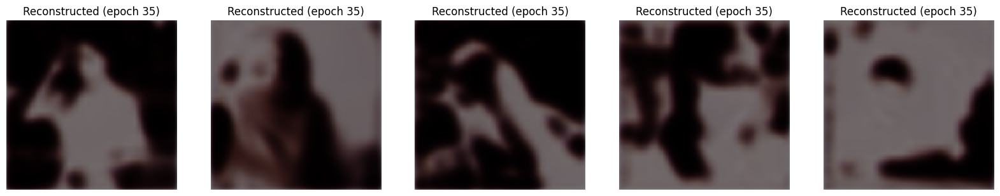

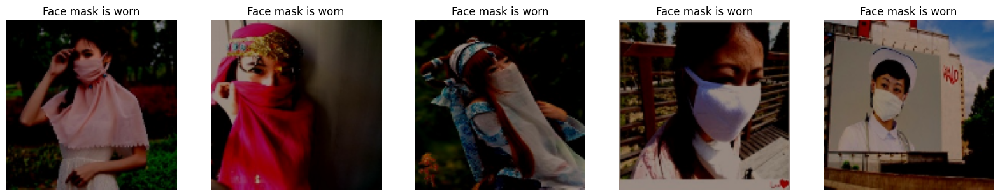

107/107 [==============================] - 1s 14ms/step


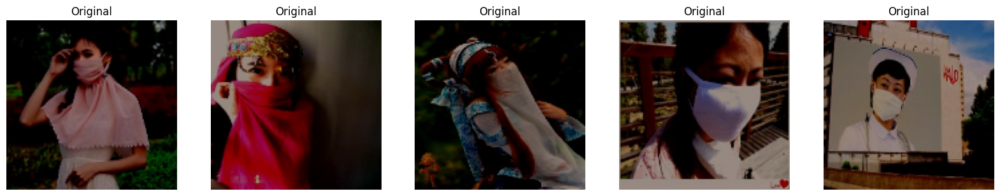

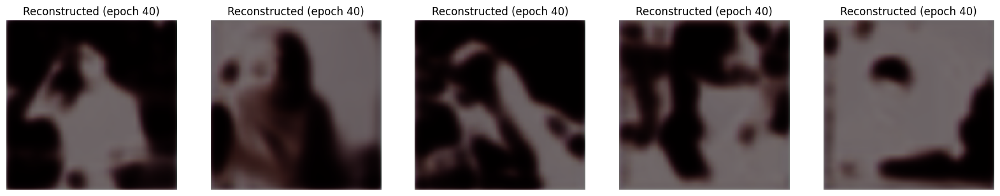

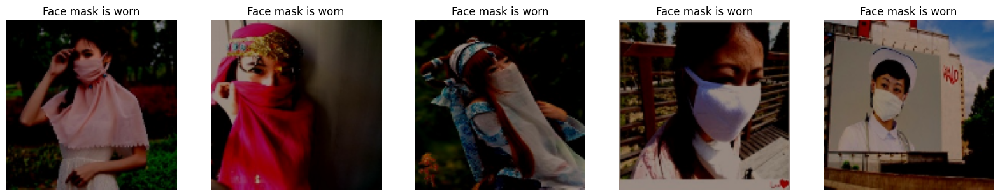

107/107 [==============================] - 1s 11ms/step


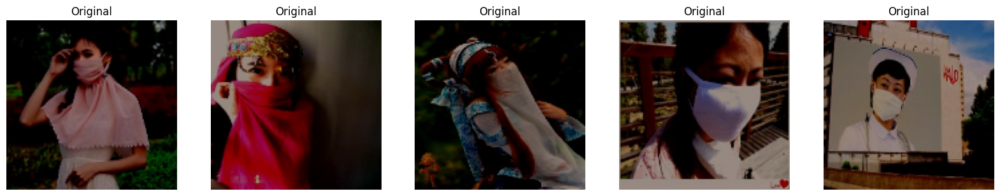

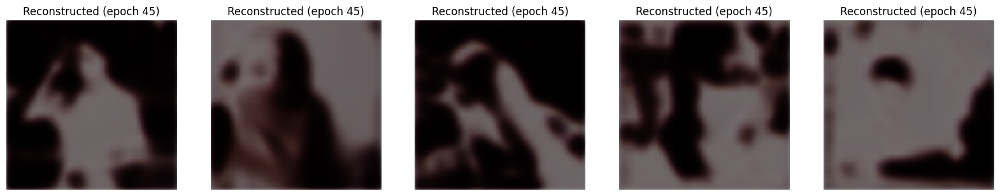

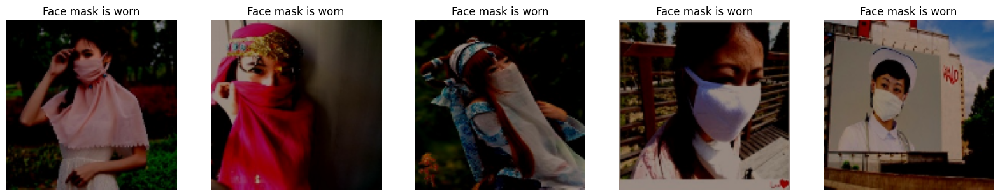

In [9]:

# Show the original test images and their reconstructed counterparts at 10 different epochs
epochs = [0, 5, 10, 15, 20, 25, 30, 35, 40, 45]
n = 5 # Number of images to show
threshold = 0.1
for epoch in epochs:
    # Get the reconstructed images
    reconstructed_images = autoencoder.predict(test_images)

    # Calculate the mean squared error
    mse = np.mean(np.power(test_images - reconstructed_images, 2), axis=(1,2,3))

    # Determine whether a face mask is worn or not in each image based on the mean squared error
    fig, axs = plt.subplots(1, n, figsize=(20, 4))
    for i in range(n):
        axs[i].imshow(test_images[i])
        axs[i].axis('off')
        axs[i].set_title('Original')
    plt.show()

    fig, axs = plt.subplots(1, n, figsize=(20, 4))
    for i in range(n):
        axs[i].imshow(reconstructed_images[i])
        axs[i].axis('off')
        axs[i].set_title('Reconstructed (epoch {})'.format(epoch))
    plt.show()

    fig, axs = plt.subplots(1, n, figsize=(20, 4))
    for i in range(n):
        if mse[i] < threshold:
            axs[i].imshow(test_images[i])
            axs[i].axis('off')
            axs[i].set_title('Face mask is worn')
        else:
            axs[i].imshow(test_images[i])
            axs[i].axis('off')
            axs[i].set_title('Face mask is not worn')
    plt.show()